In [1]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from statistics import *
import warnings
warnings.filterwarnings("ignore")
from sklearn import preprocessing
from sklearn.cluster import KMeans
import plotly.graph_objects as go  
from IPython.display import Image
import plotly.express as px
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler, normalize
import plotly.io as pio 

In [2]:
import os, sys
import warnings
warnings.filterwarnings('ignore')
sys.path.append(os.path.abspath(os.path.join('../script')))
from data_exploration import *
from Display_data import *
import data_exploration

In [5]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
# pd.set_option('max_column', None)
data = pd.read_csv("data_csv/telecom2.csv", na_values=[None, "?"])
data.head()

FileNotFoundError: [Errno 2] No such file or directory: './data_csv/telecom2.csv'

In [ ]:
# Average TCP retransmission
# Average RTT
# Handset type
# Average throughput
df = data[['MSISDN/Number','Handset Type','Avg RTT DL (ms)','Avg RTT UL (ms)',
                 'TCP DL Retrans. Vol (Bytes)','TCP UL Retrans. Vol (Bytes)',
                 'Avg Bearer TP DL (kbps)','Avg Bearer TP UL (kbps)']]

In [ ]:
df['MSISDN/Number'].fillna(value=df['MSISDN/Number'].mean(), inplace=True)
df.head(10)


,MSISDN/Number,Handset Type,Avg RTT DL (ms),Avg RTT UL (ms),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps)
0,"33,663,331,846.00",Huawei B528S-23A,61.00,46.00,"3,236,023.00","55,828.00","52,023.00","3,746.00"
1,"33,761,443,009.00",Huawei P20 Pro,47.00,7.00,"2,110,033.00","226,981.00","25,917.00","1,666.00"
2,"33,699,409,465.00",Huawei B528S-23A,76.00,25.00,"4,031,785.00","104,423.00","39,182.00","2,326.00"
3,"33,661,523,372.00",Huawei B528S-23A,88.00,29.00,"2,293.00","2,429.00","2,839.00","1,833.00"
4,"33,666,013,957.00",Huawei B528S-23A,61.00,103.00,"1,928,370.00","20,771.00","41,683.00","13,705.00"
5,"33,669,918,582.00",Huawei B528S-23A,495.00,82.00,"1,190,831.00","20,193.00","22,173.00","1,277.00"
6,"33,658,149,401.00",Huawei B528S-23A,61.00,34.00,"5,168,782.00","253,391.00","70,960.00","16,681.00"
7,"33,661,155,303.00",Huawei E5180,132.00,27.00,"14,434,904.00","48,632.00","49,052.00","9,110.00"
8,"33,762,487,551.00",Huawei B528S-23A,90.00,15.00,"4,590,603.00","116,715.00","15,834.00",976.00
9,"33,663,010,265.00",Huawei B528S-23A,109.00,24.00,"1,296,229.00","209,432.00","28,936.00","2,199.00"


In [ ]:

df['Avg RTT DL (ms)'].fillna(value=df['Avg RTT DL (ms)'].mean(), inplace=True)
df['Avg RTT UL (ms)'].fillna(value=df['Avg RTT UL (ms)'].mean(), inplace=True)

In [ ]:
df['Avg Bearer TP DL (kbps)'].fillna(value=df['Avg Bearer TP DL (kbps)'].mean(), inplace=True)
df['Avg Bearer TP UL (kbps)'].fillna(value=df['Avg Bearer TP UL (kbps)'].mean(), inplace=True)

In [ ]:
df['TCP DL Retrans. Vol (Bytes)'].fillna(value=df['TCP DL Retrans. Vol (Bytes)'].mean(), inplace=True)
df['TCP UL Retrans. Vol (Bytes)'].fillna(value=df['TCP UL Retrans. Vol (Bytes)'].mean(), inplace=True)

df.isnull().sum(axis=0)

MSISDN/Number                    0
Handset Type                   572
Avg RTT DL (ms)                  0
Avg RTT UL (ms)                  0
TCP DL Retrans. Vol (Bytes)      0
TCP UL Retrans. Vol (Bytes)      0
Avg Bearer TP DL (kbps)          0
Avg Bearer TP UL (kbps)          0
dtype: int64

In [ ]:
df['Avg Bearer TP DL (kbps)'].fillna(value=df['Avg Bearer TP DL (kbps)'].mean(), inplace=True)
df['Avg Bearer TP UL (kbps)'].fillna(value=df['Avg Bearer TP UL (kbps)'].mean(), inplace=True)


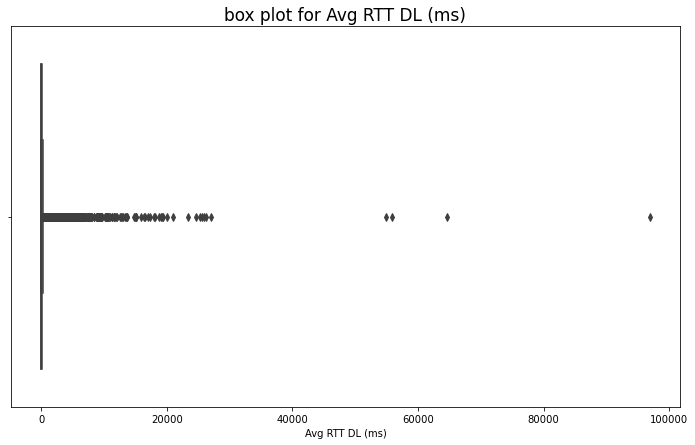

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=df, x='Avg RTT DL (ms)')
plt.title("box plot for Avg RTT DL (ms)", size=17)
plt.show()

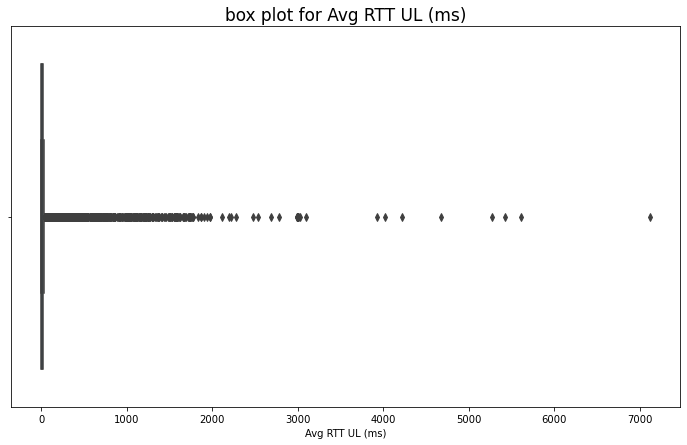

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=df, x='Avg RTT UL (ms)')
plt.title("box plot for Avg RTT UL (ms)", size=17)
plt.show()

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 56 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Unnamed: 0                                150001 non-null  int64  
 1   Bearer Id                                 149010 non-null  float64
 2   Start                                     150000 non-null  object 
 3   Start ms                                  150000 non-null  float64
 4   End                                       150000 non-null  object 
 5   End ms                                    150000 non-null  float64
 6   Dur. (ms)                                 150000 non-null  float64
 7   IMSI                                      149431 non-null  float64
 8   MSISDN/Number                             148935 non-null  float64
 9   IMEI                                      149429 non-null  float64
 10  Last Location Name  

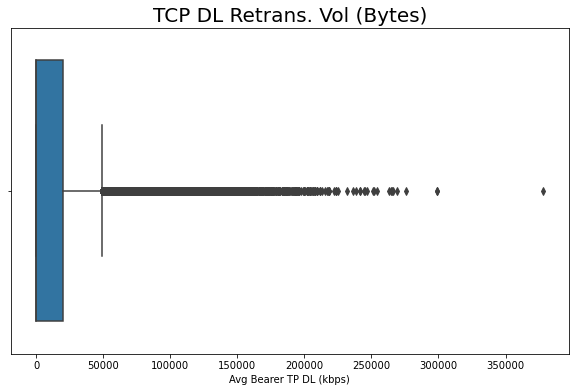

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Avg Bearer TP DL (kbps)')
plt.title("TCP DL Retrans. Vol (Bytes)", size=20)
plt.show()


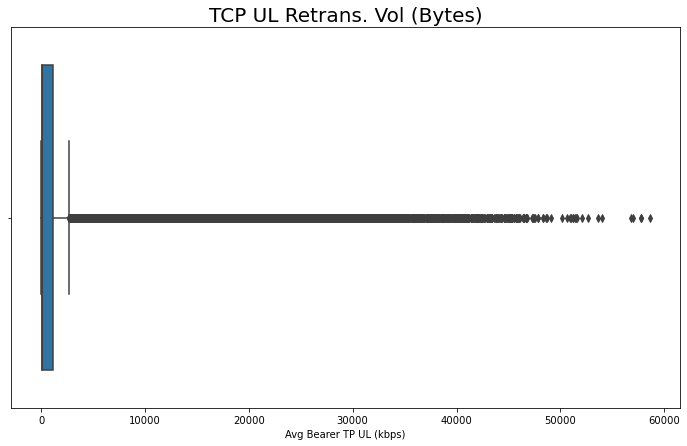

In [ ]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=df, x='Avg Bearer TP UL (kbps)')
plt.title("TCP UL Retrans. Vol (Bytes)", size=20)
plt.show()

In [ ]:
df['Avg RTT DL (ms)'] = np.where(df['Avg RTT DL (ms)'] > 220, 54, df['Avg RTT DL (ms)'])
#Printing the median and percentile of Avg RTT UL (ms)
df['Avg RTT UL (ms)'].describe()

count   150,001.00
mean         17.66
std          76.53
min           0.00
25%           3.00
50%           7.00
75%          17.66
max       7,120.00
Name: Avg RTT UL (ms), dtype: float64

In [ ]:
df['Avg RTT DL (ms)'].describe()

count   150,001.00
mean         64.17
std          37.82
min           0.00
25%          35.00
50%          54.00
75%         104.00
max         220.00
Name: Avg RTT DL (ms), dtype: float64

In [ ]:
avg_tp_uldl_columns = [
    'Avg Bearer TP DL (kbps)',
    'Avg Bearer TP UL (kbps)'
]
avg_tp_uldl = data[avg_tp_uldl_columns].sum()

<AxesSubplot:xlabel='Handset Type'>

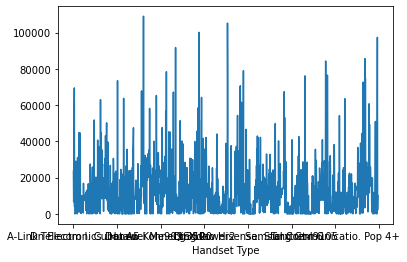

In [ ]:
handsets_data = df.groupby('Handset Type')
handsets_tp = handsets_data[avg_tp_uldl_columns].mean().sum(axis=1)
handsets_tp.plot()

In [ ]:
df['Total_Avg_RTT'] = df['Avg RTT DL (ms)'] + \
                                      df['Avg RTT UL (ms)']

df['Total_Avg_Bearer_TP'] = df['Avg Bearer TP DL (kbps)'] + \
                                      df['Avg Bearer TP DL (kbps)']

df['Total_Avg_TCP'] = df['TCP DL Retrans. Vol (Bytes)'] + \
                                      df['TCP UL Retrans. Vol (Bytes)']
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 11 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   MSISDN/Number                150001 non-null  float64
 1   Handset Type                 149429 non-null  object 
 2   Avg RTT DL (ms)              150001 non-null  float64
 3   Avg RTT UL (ms)              150001 non-null  float64
 4   TCP DL Retrans. Vol (Bytes)  150001 non-null  float64
 5   TCP UL Retrans. Vol (Bytes)  150001 non-null  float64
 6   Avg Bearer TP DL (kbps)      150001 non-null  float64
 7   Avg Bearer TP UL (kbps)      150001 non-null  float64
 8   Total_Avg_RTT                150001 non-null  float64
 9   Total_Avg_Bearer_TP          150001 non-null  float64
 10  Total_Avg_TCP                150001 non-null  float64
dtypes: float64(10), object(1)
memory usage: 12.6+ MB


In [ ]:
# Compute & list 10 of the top, bottom and most frequent:
# TCP values in the dataset.
# RTT values in the dataset.
# Throughput values in the dataset.

In [ ]:
sorted_by_tcp = df.sort_values(
    'Total_Avg_TCP', ascending=False)
top_10 = sorted_by_tcp.head(10)['Total_Avg_TCP']
last_10 = sorted_by_tcp.tail(10)['Total_Avg_TCP']
most_10 = df['Total_Avg_TCP'].value_counts().head(10)

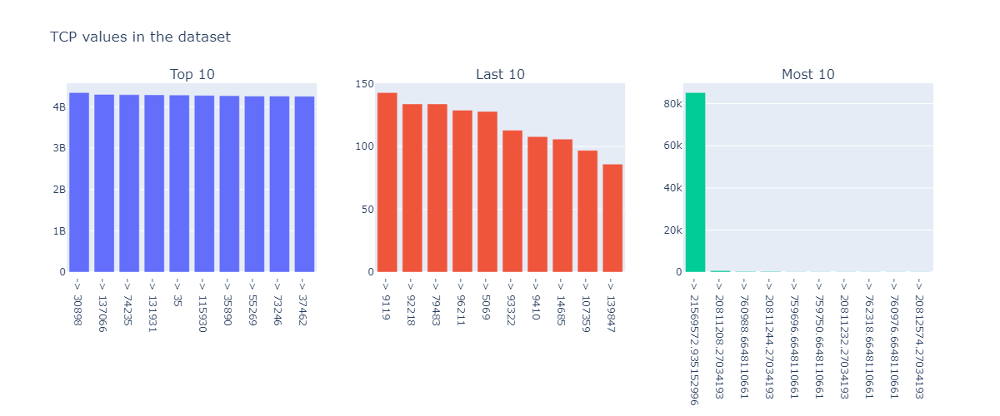

In [ ]:
def mult_hist(sr, rows, cols, title_text, subplot_titles, interactive=False):
    fig = make_subplots(rows=rows, cols=cols, subplot_titles=subplot_titles)
    for i in range(rows):
        for j in range(cols):
            x = ["-> " + str(i) for i in sr[i+j].index]
            fig.add_trace(go.Bar(x=x, y=sr[i+j].values), row=i+1, col=j+1)
    fig.update_layout(showlegend=False, title_text=title_text)
    if(interactive):
        fig.show()
    else:
        return Image(pio.to_image(fig, format='png', width=1200))
mult_hist([top_10, last_10, most_10], 1,
          3, "TCP values in the dataset", ['Top 10', 'Last 10', 'Most 10'])

In [ ]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.


In [ ]:
sorted_by_RTT = df.sort_values(
    'Total_Avg_RTT', ascending=False)
top_10 = sorted_by_RTT.head(10)['Total_Avg_RTT']
last_10 = sorted_by_RTT.tail(10)['Total_Avg_RTT']
most_10 = df['Total_Avg_RTT'].value_counts().head(10)

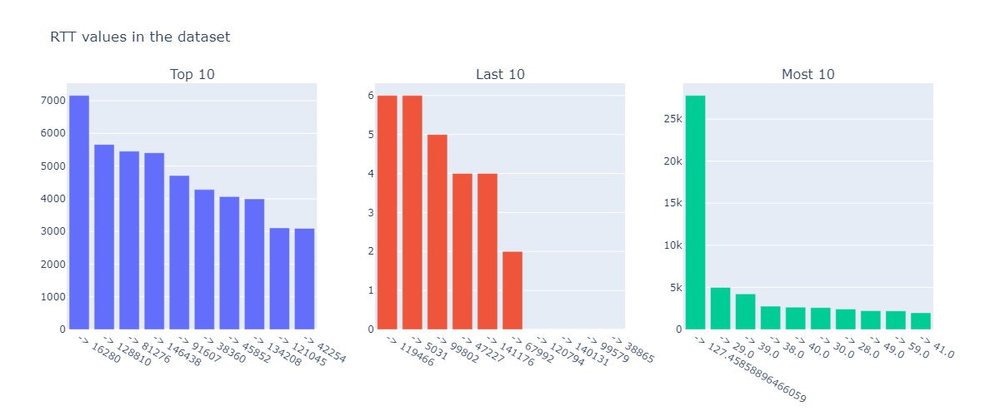

In [ ]:
mult_hist([top_10, last_10, most_10, top_10], 1,
          3, "RTT values in the dataset", ['Top 10', 'Last 10', 'Most 10'])

In [ ]:
sorted_by_Bearer_TP = df.sort_values(
    'Total_Avg_Bearer_TP', ascending=False)
top_10 = sorted_by_Bearer_TP.head(10)['Total_Avg_Bearer_TP']
last_10 = sorted_by_Bearer_TP.tail(10)['Total_Avg_Bearer_TP']
most_10 = df['Total_Avg_Bearer_TP'].value_counts().head(10)

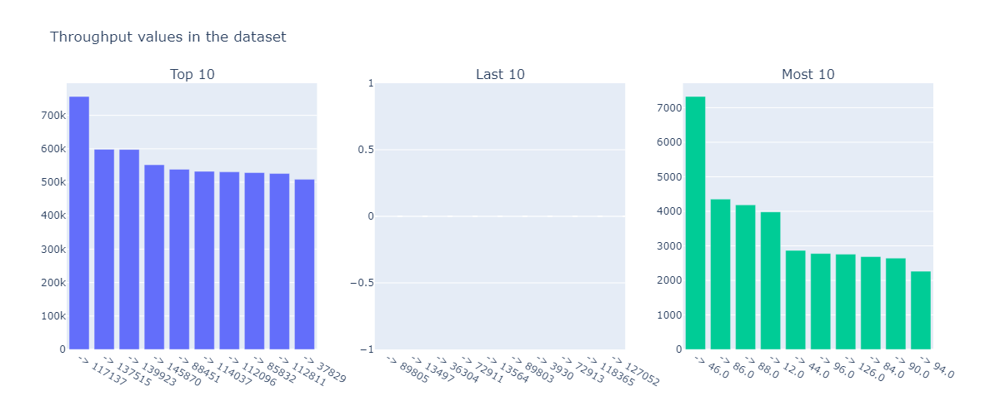

In [ ]:
mult_hist([top_10, last_10, most_10, top_10], 1,
          3, "Throughput values in the dataset", ['Top 10', 'Last 10', 'Most 10'])

In [ ]:
# Compute & report:
# The distribution of the average throughput per handset type and provide interpretation for your findings.
# The average TCP retransmission view per handset type and provide interpretation for your findings.
handset_type_agg = df.groupby('Handset Type').agg(
    {'Total_Avg_Bearer_TP': 'mean', 'Total_Avg_TCP': 'mean'})
handset_type_agg.head()

,Total_Avg_Bearer_TP,Total_Avg_TCP
Handset Type,,
A-Link Telecom I. Cubot A5,"46,368.00","21,569,572.94"
A-Link Telecom I. Cubot Note Plus,"13,054.00","616,213.00"
A-Link Telecom I. Cubot Note S,"17,030.00","41,411,731.00"
A-Link Telecom I. Cubot Nova,"111,334.00","137,170.00"
A-Link Telecom I. Cubot Power,"138,252.00","8,041.00"


,Total_Avg_Bearer_TP
count,"1,396.00"
mean,"22,653.92"
std,"27,301.59"
min,0.00
25%,"2,096.21"
50%,"15,448.72"
75%,"31,590.41"
max,"209,338.00"


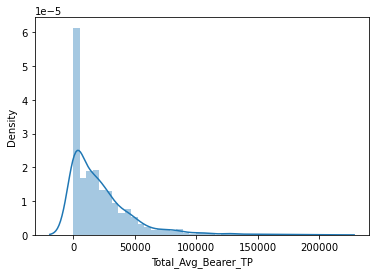

In [ ]:
sorted_by_tp = handset_type_agg.sort_values('Total_Avg_Bearer_TP', ascending=False)
top_tp = sorted_by_tp['Total_Avg_Bearer_TP']
 
sns.distplot(top_tp)
pd.DataFrame(top_tp.describe()) 

In [ ]:
# Task 3.4 - Using the experience metrics above, perform a k-means clustering (where k = 3) to segment users into groups of experiences and provide a brief description of each cluster. (The description must define each group based on your understanding of the data)
metrics = df[[
    "Total_Avg_RTT",
    "Total_Avg_Bearer_TP",
    "Total_Avg_TCP"]].copy()
metrics.head()

,Total_Avg_RTT,Total_Avg_Bearer_TP,Total_Avg_TCP
0,107.00,"104,046.00","3,291,851.00"
1,54.00,"51,834.00","2,337,014.00"
2,101.00,"78,364.00","4,136,208.00"
3,117.00,"5,678.00","4,722.00"
4,164.00,"83,366.00","1,949,141.00"


In [ ]:
scaler = StandardScaler()
scaled_array = scaler.fit_transform(metrics)
pd.DataFrame(scaled_array).head(5)

,0,1,2
0,0.29,1.62,-0.15
1,-0.32,0.53,-0.16
2,0.22,1.08,-0.15
3,0.41,-0.44,-0.18
4,0.95,1.18,-0.17


In [ ]:
data_normalized = normalize(scaled_array)
pd.DataFrame(data_normalized).head(5)

,0,1,2
0,0.18,0.98,-0.09
1,-0.50,0.83,-0.25
2,0.20,0.97,-0.13
3,0.65,-0.70,-0.29
4,0.62,0.78,-0.11


In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(data_normalized)
kmeans.labels_
df.insert(0, 'Cluster', kmeans.labels_)
df.head(10)

,Cluster,MSISDN/Number,Handset Type,Avg RTT DL (ms),Avg RTT UL (ms),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),Total_Avg_RTT,Total_Avg_Bearer_TP,Total_Avg_TCP
0,2,"33,663,331,846.00",Huawei B528S-23A,61.00,46.00,"3,236,023.00","55,828.00","52,023.00","3,746.00",107.00,"104,046.00","3,291,851.00"
1,2,"33,761,443,009.00",Huawei P20 Pro,47.00,7.00,"2,110,033.00","226,981.00","25,917.00","1,666.00",54.00,"51,834.00","2,337,014.00"
2,2,"33,699,409,465.00",Huawei B528S-23A,76.00,25.00,"4,031,785.00","104,423.00","39,182.00","2,326.00",101.00,"78,364.00","4,136,208.00"
3,0,"33,661,523,372.00",Huawei B528S-23A,88.00,29.00,"2,293.00","2,429.00","2,839.00","1,833.00",117.00,"5,678.00","4,722.00"
4,2,"33,666,013,957.00",Huawei B528S-23A,61.00,103.00,"1,928,370.00","20,771.00","41,683.00","13,705.00",164.00,"83,366.00","1,949,141.00"
5,2,"33,669,918,582.00",Huawei B528S-23A,54.00,82.00,"1,190,831.00","20,193.00","22,173.00","1,277.00",136.00,"44,346.00","1,211,024.00"
6,2,"33,658,149,401.00",Huawei B528S-23A,61.00,34.00,"5,168,782.00","253,391.00","70,960.00","16,681.00",95.00,"141,920.00","5,422,173.00"
7,2,"33,661,155,303.00",Huawei E5180,132.00,27.00,"14,434,904.00","48,632.00","49,052.00","9,110.00",159.00,"98,104.00","14,483,536.00"
8,0,"33,762,487,551.00",Huawei B528S-23A,90.00,15.00,"4,590,603.00","116,715.00","15,834.00",976.00,105.00,"31,668.00","4,707,318.00"
9,2,"33,663,010,265.00",Huawei B528S-23A,109.00,24.00,"1,296,229.00","209,432.00","28,936.00","2,199.00",133.00,"57,872.00","1,505,661.00"


In [ ]:
fig = px.scatter(df, x='Total_Avg_RTT', y="Total_Avg_Bearer_TP",
                 color='Cluster', size='Total_Avg_TCP')
fig.show()

In [ ]:
df.to_csv('./user_experiance.csv')

In [ ]:
import pickle
with open("./user_exp.pkl", "wb") as f:
    pickle.dump(kmeans, f)